## 1. <Directed Acyclic Graph 구현을 위한 데이터 전처리 코드>

###   1) 총 시뮬레이션 시간 동안의 노드 간 연기 이동 방향 분석
- Stationary dBN
- Non-stationary dBN

#### (1) 노드 간 연기 이동 전처리 -> 데이터 프레임화

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import IPython

In [2]:
# node(Labelized Variable)별 space aim number(xml space name) -> node numbering dictionary
xml2node_code = {'3252':'r1', '3300':'r2', '3348':'r3', '3396':'r4', '3344':'r5', '3492':'r6',
               '2594':'r7', '2642':'r8', '2695':'r9', '1715':'r10', '1773':'r11', '0390':'r12',
               '0438':'r13', '0491':'r14', '3093':'r15', '3151':'r16', '3204':'r17', '1836':'r18', 
               '1899':'r19', '0909':'r20', '0967':'r21', '1020':'r22', '0080':'r23', '0193':'r24', 
                '0241':'r25', '0294':'r26', '0342':'r27', '2154':'r28', '1275':'r29', '2435':'r30',
               '1556':'r31', '2207':'r32', '2260':'r33', '2313':'r34', '1328':'r35', '1381':'r36',
               '1434':'r37', '2753':'r38', '2806':'r39', '2870':'r40', '2923':'r41', '2976':'r42',
               '3040':'r43', '1947':'r44', '2000':'r45', '1068':'r46', '1121':'r47', '2488':'r48',
               '2541':'r49', '1609':'r50', '1662':'r51', '0549':'r52', '0602':'r53', '0676':'r54',
               '0729':'r55', '0782':'r56', '0856':'r57', '2058':'r58', '3540':'r59', '1179':'r60',
               '3609':'r61', '2366':'r62', '3678':'r63', '1487':'r64', '3774':'r65'}

df_mafldensity_raw = pd.read_csv('d.massfluxdensity/analysis_md_aim2870.csv', encoding='utf-8')
# df_mafldensity_raw: 각 time 당 두 room 사이의 mass flux density 이동량
df_mafldensity_raw['Time'] = df_mafldensity_raw['Time'].map(lambda x: int(str(x).split('.')[0])) # time column 소숫점 자리 제거

# raw dataframe melting : [Time] column data -> id_vars, column에 있는 variables -> var_name, 기존데이터 value값 -> MassFluxDensity(kg/s)
df_mafldensity_raw = df_mafldensity_raw.melt(id_vars=['Time'], var_name = 'roomij(i_j)', value_name = 'MassFluxDensity(kg/s)')

In [3]:
# roomij(i_j)에 있는 값을 '_'로 전부 분리해서 정리
df_mafldensity_raw['room i'] = df_mafldensity_raw['roomij(i_j)'].map(lambda x: str(x).split('_')[1])
df_mafldensity_raw['room j'] = df_mafldensity_raw['roomij(i_j)'].map(lambda x: str(x).split('_')[2])
df_mafldensity_raw = df_mafldensity_raw.drop('roomij(i_j)', axis = 1)
df_mafldensity_raw.replace({'room i':xml2node_code}, inplace = True)
df_mafldensity_raw.replace({'room j':xml2node_code}, inplace = True)

In [4]:
df_mafldensity_raw

,Time,MassFluxDensity(kg/s),room i,room j
0,0,0.000000,r7,r44
1,1,0.000000,r7,r44
2,2,0.000000,r7,r44
3,3,0.000000,r7,r44
4,4,0.000000,r7,r44
...,...,...,...,...
29995,395,0.000389,r50,r51
29996,396,0.000394,r50,r51
29997,397,0.000390,r50,r51
29998,398,0.000381,r50,r51


In [5]:
# 총 시뮬레이션 시간 동안 space 간 연기 이동이 없는 경우가 있는지 확인
df_Smafldensity = df_mafldensity_raw.groupby(by=['room i', 'room j']).sum().reset_index()
if len(df_Smafldensity[df_Smafldensity['MassFluxDensity(kg/s)'] == 0]) == 0:
    pass
else:
    print(len(df_Smafldensity[df_Smafldensity['MassFluxDensity(kg/s)'] == 0]))

In [6]:
df_mafldensity_raw

,Time,MassFluxDensity(kg/s),room i,room j
0,0,0.000000,r7,r44
1,1,0.000000,r7,r44
2,2,0.000000,r7,r44
3,3,0.000000,r7,r44
4,4,0.000000,r7,r44
...,...,...,...,...
29995,395,0.000389,r50,r51
29996,396,0.000394,r50,r51
29997,397,0.000390,r50,r51
29998,398,0.000381,r50,r51


In [7]:
# dataframe 정리
df_mafldensity_raw['room ini'], df_mafldensity_raw['room fin'] = "", ""
df_mafldensity_raw

,Time,MassFluxDensity(kg/s),room i,room j,room ini,room fin
0,0,0.000000,r7,r44,,
1,1,0.000000,r7,r44,,
2,2,0.000000,r7,r44,,
3,3,0.000000,r7,r44,,
4,4,0.000000,r7,r44,,
...,...,...,...,...,...,...
29995,395,0.000389,r50,r51,,
29996,396,0.000394,r50,r51,,
29997,397,0.000390,r50,r51,,
29998,398,0.000381,r50,r51,,


#### (2) 노드 간 연기 이동 "방향" 판단 -> 데이터 프레임 column 추가: 출발 room - [room ini], 도착 room - [room fin]
- relationship modeling.xlsx - room간 방향성을 모델링한 파일
- 예를 들어, r65가 r57보다 위에 있기 때문에, massfluxdensity값이 양수이면 massflux가 일어난 방향이 r57 -> r65임.
- 이것은 DAG 결정에 있어 중요한 증거이기 때문에 분석에 추가하였음.
- 같은 room들 간 이동이어도 매초마다 양수일 수도 음수일 수도 있으므로 더 우세한 쪽의 방향을 따르는 것이 맞음.

###### 이를 위해서 분석 자동화 코드는 다음을 포함한다.
   1) 같은 room들 간 이동에서, massfluxdensity가 양수인 경우의 수와 음수인 경우의 수를 세어 비교
   2) sum값의 부호가 1)의 우세한 부호와 일지하는지 확인

In [8]:
room_relation = pd.read_csv('d.others/relationship_modeling.csv', encoding='utf-8')

index_name = []
for colname in room_relation.columns[:]:
    index_name.append('r{}'.format(colname))
    room_relation.rename(columns = {colname:'r{}'.format(colname)}, inplace=True)

room_relation.index = pd.Series(index_name)

In [9]:
room_relation = room_relation.replace('-', np.nan)
room_relation

,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,...,r56,r57,r58,r59,r60,r61,r62,r63,r64,r65
r1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
r2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
r3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
r4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
r5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
r61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1,-1,NaN,NaN,NaN,NaN,NaN
r62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,-1,NaN
r63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,-1
r64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,1


In [10]:
# room_relation 데이터 프레임에서 room과의 관계를 읽어, 정리된 df_mafldensity_raw 데이터 프레임에 적용
# 매초(time) 별로 어느 room에서 어떤 room으로 매연입자가 확산하는지를 판단하여 새 컬럼에 기록
df_mafldensity_values_list = df_mafldensity_raw.values.tolist()

for x in df_mafldensity_values_list:
    values_index = df_mafldensity_values_list.index(x)
    
    if int(room_relation.loc[x[2], x[3]]) * x[1] > 0:
        df_mafldensity_raw.loc[values_index, 'room ini'] = x[2]
        df_mafldensity_raw.loc[values_index, 'room fin'] = x[3]
        
    elif int(room_relation.loc[x[2], x[3]]) * x[1] < 0:
        df_mafldensity_raw.loc[values_index, 'room ini'] = x[3]
        df_mafldensity_raw.loc[values_index, 'room fin'] = x[2]
        
    else:
        df_mafldensity_raw.loc[values_index, 'room ini'] = np.nan
        df_mafldensity_raw.loc[values_index, 'room fin'] = np.nan

df_mafldensity_raw

,Time,MassFluxDensity(kg/s),room i,room j,room ini,room fin
0,0,0.000000,r7,r44,NaN,NaN
1,1,0.000000,r7,r44,NaN,NaN
2,2,0.000000,r7,r44,NaN,NaN
3,3,0.000000,r7,r44,NaN,NaN
4,4,0.000000,r7,r44,NaN,NaN
...,...,...,...,...,...,...
29995,395,0.000389,r50,r51,r50,r51
29996,396,0.000394,r50,r51,r50,r51
29997,397,0.000390,r50,r51,r50,r51
29998,398,0.000381,r50,r51,r50,r51


In [11]:
# 전처리된 room 간 연기 이동 데이터프레임 -> out
df_mafldensity_tidy = df_mafldensity_raw.copy()
df_mafldensity_tidy.to_csv("r.preprocessed/2870(40).csv")

df_mafldensity_tidy['room i_j'] = df_mafldensity_tidy['room i']+'_'+df_mafldensity_tidy['room j']
df_mafldensity_tidy.drop(columns=['room i', 'room j'], inplace = True)
df_mafldensity_tidy['room ini_fin'] = df_mafldensity_tidy['room ini']+'_'+df_mafldensity_tidy['room fin']
df_mafldensity_tidy.drop(columns=['room ini', 'room fin'], inplace = True)

In [12]:
df_mafldensity_tidy

,Time,MassFluxDensity(kg/s),room i_j,room ini_fin
0,0,0.000000,r7_r44,NaN
1,1,0.000000,r7_r44,NaN
2,2,0.000000,r7_r44,NaN
3,3,0.000000,r7_r44,NaN
4,4,0.000000,r7_r44,NaN
...,...,...,...,...
29995,395,0.000389,r50_r51,r50_r51
29996,396,0.000394,r50_r51,r50_r51
29997,397,0.000390,r50_r51,r50_r51
29998,398,0.000381,r50_r51,r50_r51


In [13]:
grouped=df_mafldensity_tidy.groupby(['room i_j', 'room ini_fin']).count()
grouped.reset_index(level=['room i_j', 'room ini_fin'], inplace = True)
list_grouped_values = grouped.values.tolist()

In [14]:
list_grouped_values

[['r10_r46', 'r10_r46', 43, 43],
 ['r10_r46', 'r46_r10', 168, 168],
 ['r11_r47', 'r47_r11', 237, 237],
 ['r15_r48', 'r48_r15', 297, 297],
 ['r16_r49', 'r49_r16', 286, 286],
 ['r17_r49', 'r49_r17', 287, 287],
 ['r1_r38', 'r38_r1', 326, 326],
 ['r20_r50', 'r50_r20', 221, 221],
 ['r21_r51', 'r51_r21', 226, 226],
 ['r23_r52', 'r52_r23', 282, 282],
 ['r27_r57', 'r57_r27', 280, 280],
 ['r29_r60', 'r60_r29', 266, 266],
 ['r2_r39', 'r39_r2', 322, 322],
 ['r30_r63', 'r63_r30', 328, 328],
 ['r31_r65', 'r65_r31', 254, 254],
 ['r32_r40', 'r32_r40', 45, 45],
 ['r32_r40', 'r40_r32', 303, 303],
 ['r33_r40', 'r33_r40', 53, 53],
 ['r33_r40', 'r40_r33', 299, 299],
 ['r34_r41', 'r41_r34', 328, 328],
 ['r35_r54', 'r54_r35', 248, 248],
 ['r36_r54', 'r54_r36', 240, 240],
 ['r37_r55', 'r55_r37', 237, 237],
 ['r38_r39', 'r39_r38', 366, 366],
 ['r38_r58', 'r38_r58', 357, 357],
 ['r39_r40', 'r40_r39', 383, 383],
 ['r39_r59', 'r39_r59', 364, 364],
 ['r3_r40', 'r40_r3', 361, 361],
 ['r40_r41', 'r40_r41', 383, 383

In [15]:
smoke_move_relation = []
for li in range(len(list_grouped_values)+1):
    if li+1 < len(list_grouped_values):
        list_this_turn = list_grouped_values[li]
        list_next_turn = list_grouped_values[li+1]
        
        if list_this_turn[0] == list_next_turn[0]:
            if list_this_turn[2] > list_next_turn[2]:
                smoke_move_relation.append(list_this_turn[1])
            elif list_this_turn[2] < list_next_turn[2]:
                smoke_move_relation.append(list_next_turn[1])
            else:
                smoke_move_relation.append('identical')
        
        else:
            reverse_list_this_turn = list_this_turn[1].split('_')[1] + '_' + list_this_turn[1].split('_')[0]
            if smoke_move_relation.count(list_this_turn[1]) == 0 and smoke_move_relation.count(reverse_list_this_turn) == 0:
                if smoke_move_relation[-1] != list_this_turn[0]:
                    smoke_move_relation.append(list_this_turn[1])
                
                    if (list_next_turn == list_grouped_values[-1]) and (smoke_move_relation.count(list_next_turn[1]) == 0):
                        smoke_move_relation.append(list_next_turn[1])

len(smoke_move_relation)

75

In [16]:
pair_of_smr = [tuple(x.split('_')) for x in smoke_move_relation]
pair_of_smr0 = [tuple (y+'_0' for y in tuple(x.split('_'))) for x in smoke_move_relation]
pair_of_smrt = [tuple (y+'_t' for y in tuple(x.split('_'))) for x in smoke_move_relation]

In [17]:
pair_of_smr

[('r46', 'r10'),
 ('r47', 'r11'),
 ('r48', 'r15'),
 ('r49', 'r16'),
 ('r49', 'r17'),
 ('r38', 'r1'),
 ('r50', 'r20'),
 ('r51', 'r21'),
 ('r52', 'r23'),
 ('r57', 'r27'),
 ('r60', 'r29'),
 ('r39', 'r2'),
 ('r63', 'r30'),
 ('r65', 'r31'),
 ('r40', 'r32'),
 ('r40', 'r33'),
 ('r41', 'r34'),
 ('r54', 'r35'),
 ('r54', 'r36'),
 ('r55', 'r37'),
 ('r39', 'r38'),
 ('r38', 'r58'),
 ('r40', 'r39'),
 ('r39', 'r59'),
 ('r40', 'r3'),
 ('r40', 'r41'),
 ('r41', 'r42'),
 ('r42', 'r43'),
 ('r42', 'r62'),
 ('r43', 'r63'),
 ('r44', 'r10'),
 ('r45', 'r44'),
 ('r45', 'r11'),
 ('r58', 'r45'),
 ('r46', 'r12'),
 ('r46', 'r13'),
 ('r47', 'r46'),
 ('r47', 'r14'),
 ('r60', 'r47'),
 ('r48', 'r18'),
 ('r48', 'r49'),
 ('r49', 'r19'),
 ('r41', 'r4'),
 ('r50', 'r18'),
 ('r50', 'r51'),
 ('r19', 'r51'),
 ('r51', 'r22'),
 ('r52', 'r53'),
 ('r60', 'r52'),
 ('r53', 'r54'),
 ('r61', 'r53'),
 ('r54', 'r24'),
 ('r54', 'r55'),
 ('r55', 'r25'),
 ('r56', 'r55'),
 ('r56', 'r26'),
 ('r57', 'r56'),
 ('r58', 'r28'),
 ('r59', 'r58'),
 

#### (3) 노드 간 연기 이동 "방향"으로 시각화 -> DAG 결정

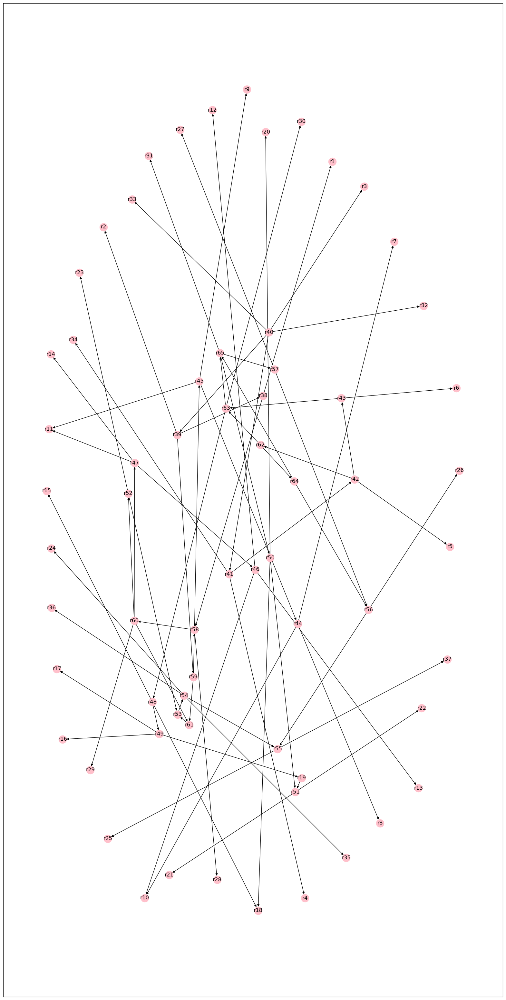

In [18]:
figures = []
plt.figure(figsize=(20,40))
G = nx.DiGraph()
G.add_edges_from(pair_of_smr)
nx.draw_networkx(G, arrows = True, node_color = 'pink')
figures.append(G)
plt.savefig('r.dag/2870(40).png')

## 2. <PyArgum 라이브러리를 이용한 동적 베이지안 네트워크 구현>

###   1) unStationary dBN (nsDBN)
 - DAG 유지, 확률변화 (CPT 변화 DBN만들기)

In [19]:
import pyAgrum as gum
import pyAgrum.lib.dynamicBN as gdyn
import pyAgrum.lib.notebook as gnb

In [20]:
dag_dBN = gum.BayesNet('2870(40)')
dag_nodes = list(G.nodes)
dBN_nodes = []

for node in dag_nodes:
    globals()[node+'_0'] = dag_dBN.add(gum.LabelizedVariable(node+'_0',node+'_0',2))
    globals()[node+'_t'] = dag_dBN.add(gum.LabelizedVariable(node+'_t',node+'_t',2))
    dBN_nodes.append(node+'_0')
    dBN_nodes.append(node+'_t')

In [21]:
pair_of_self = [(node+'_0', node+'_t') for node in dag_nodes]
for link in pair_of_smr0:
    dag_dBN.addArc(*link)

print(dag_dBN)

for link in pair_of_smrt:
    dag_dBN.addArc(*link)

print(dag_dBN)

for link in pair_of_self:
    dag_dBN.addArc(*link)

BN{nodes: 130, arcs: 75, domainSize: 10^39.1339, dim: 216, mem: 3Ko 384o}
BN{nodes: 130, arcs: 150, domainSize: 10^39.1339, dim: 302, mem: 4Ko 736o}


In [22]:
for i in dBN_nodes:
    print(dag_dBN.cpt(i))


      ||  r46_0            |
r47_0 ||0        |1        |
------||---------|---------|
0     || 0.0000  | 0.0000  |
1     || 0.0000  | 0.0000  |


             ||  r46_t            |
r47_t |r46_0 ||0        |1        |
------|------||---------|---------|
0     |0     || 0.0000  | 0.0000  |
1     |0     || 0.0000  | 0.0000  |
0     |1     || 0.0000  | 0.0000  |
1     |1     || 0.0000  | 0.0000  |


             ||  r10_0            |
r46_0 |r44_0 ||0        |1        |
------|------||---------|---------|
0     |0     || 0.0000  | 0.0000  |
1     |0     || 0.0000  | 0.0000  |
0     |1     || 0.0000  | 0.0000  |
1     |1     || 0.0000  | 0.0000  |


                    ||  r10_t            |
r46_t |r44_t |r10_0 ||0        |1        |
------|------|------||---------|---------|
0     |0     |0     || 0.0000  | 0.0000  |
1     |0     |0     || 0.0000  | 0.0000  |
0     |1     |0     || 0.0000  | 0.0000  |
1     |1     |0     || 0.0000  | 0.0000  |
0     |0     |1     || 0.0000  | 0.0000  |


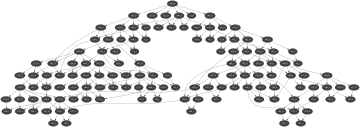

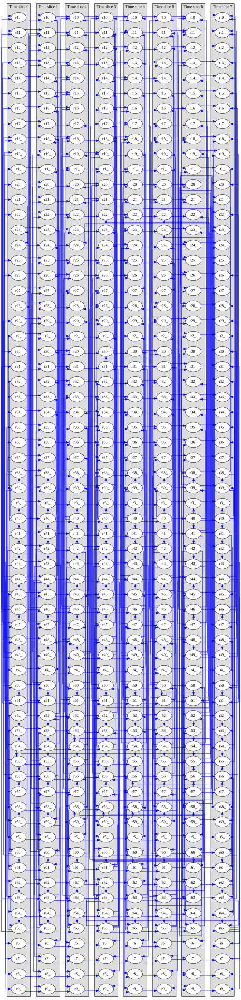

In [23]:
T = 8

gnb.showBN(dag_dBN)

ftts_dbn = gdyn.unroll2TBN(dag_dBN, T)
gdyn.showTimeSlices(ftts_dbn, size="30")

In [24]:
ftts_dbn_nodes = ftts_dbn.names()
ts_0 = sorted([e for e in ftts_dbn_nodes
          if (int(e.split('_')[1]) == 0)])
ts_1 = sorted([e for e in ftts_dbn_nodes
          if (int(e.split('_')[1]) in range(1, 2))])

In [25]:
ts_2to3 = sorted([e for e in ftts_dbn_nodes
          if (int(e.split('_')[1]) in range(2, 4))])
ts_4to5 = sorted([e for e in ftts_dbn_nodes
          if (int(e.split('_')[1]) in range(4, 6))])
ts_6to7 = sorted([e for e in ftts_dbn_nodes
          if (int(e.split('_')[1]) in range(6, 8))])

### 2) CPT timeslice별 리스트 작성 (CPT_calculation_template_EXP.xlsx 템플릿 이용)

####  (1) CPT를 엑셀 템플릿으로 계산할 때는 총 400초의 simulation time을 100초 단위로 끊어 네 구간에서 계산
####  (2) pyAgrum을 이용한 dBN을 만들 때에는 400초를 8구간으로 나누어 생각함. (50s로 단위로 끊은 후 두 구간씩 같은 list를 사용한다.)

In [26]:
cpt_0 = [[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[1, 0],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0044,0.9956,0.0044,0.9956,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0049,0.9951,0.0051,0.9949,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0047,0.9953,0.0000,1.0000,0.0047,0.9953,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0100,0.9900,0.0045,0.9955,0.0055,0.9945,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0039,0.9961,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000]]
cpt_1= [[1.0000,0.0000,0.4369,0.5631,0.4369,0.5631,0.4369,0.5631,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.3562,0.6438,0.3562,0.6438,0.3562,0.6438,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.5876,0.4124,0.5876,0.4124,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.4123,0.5877,0.4123,0.5877,0.4123,0.5877,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.3033,0.6967,0.2521,0.7479,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.3550,0.6450,0.2006,0.7994,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.2476,0.7524,0.2718,0.7282,0.0000,1.0000],[1.0000,0.0000,0.4003,0.5997,0.2315,0.7685,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.1048,0.8952,0.2301,0.7699,0.0000,1.0000],[1.0000,0.0000,0.1328,0.8672,0.2055,0.7945,0.0000,1.0000],[1.0000,0.0000,0.1706,0.8294,0.2286,0.7714,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.1522,0.8478,0.1577,0.8423,0.0000,1.0000],[1.0000,0.0000,0.0742,0.9258,0.0859,0.9141,0.0000,1.0000],[1.0000,0.0000,0.1544,0.8456,0.1391,0.8609,0.0000,1.0000],[0.0100,0.9900,0.0000,1.0000],[1.0000,0.0000,0.0669,0.9331,0.0888,0.9113,0.0000,1.0000],[1.0000,0.0000,0.1527,0.8473,0.1674,0.8326,0.0000,1.0000],[1.0000,0.0000,0.2383,0.7617,0.2517,0.7483,0.0000,1.0000],[1.0000,0.0000,0.4144,0.5856,0.3056,0.6944,0.0000,1.0000],[1.0000,0.0000,0.3038,0.6962,0.2506,0.7494,0.0000,1.0000],[1.0000,0.0000,0.2794,0.7206,0.2068,0.7932,0.0000,1.0000],[1.0000,0.0000,0.1445,0.8555,0.1288,0.8712,0.0000,1.0000],[1.0000,0.0000,0.3663,0.6337,0.3082,0.6918,0.0000,1.0000],[1.0000,0.0000,0.4974,0.5026,0.3668,0.6332,0.0000,1.0000],[1.0000,0.0000,0.1485,0.8515,0.1418,0.8582,0.0000,1.0000],[1.0000,0.0000,0.5457,0.4543,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.4664,0.5336,0.3825,0.6175,0.0000,1.0000],[1.0000,0.0000,0.6029,0.3971,0.3628,0.6372,0.3628,0.6372,0.2401,0.7599,0.2401,0.7599,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.5248,0.4752,0.4397,0.5603,0.0000,1.0000],[1.0000,0.0000,0.2528,0.7472,0.2619,0.7381,0.1195,0.8805,0.2757,0.7243,0.1333,0.8667,0.1424,0.8576,0.0000,1.0000],[1.0000,0.0000,0.1364,0.8636,0.1554,0.8446,0.0000,1.0000],[1.0000,0.0000,0.3202,0.6798,0.2753,0.7247,0.0000,1.0000],[1.0000,0.0000,0.3475,0.6525,0.3267,0.6733,0.0000,1.0000],[1.0000,0.0000,0.2296,0.7704,0.4087,0.5913,0.2296,0.7704,0.1791,0.8209,0.0000,1.0000,0.1791,0.8209,0.0000,1.0000],[1.0000,0.0000,0.2395,0.7605,0.1954,0.8046,0.0000,1.0000],[1.0000,0.0000,0.3229,0.6771,0.3623,0.6377,0.1751,0.8249,0.3350,0.6650,0.1478,0.8522,0.1871,0.8129,0.0000,1.0000],[1.0000,0.0000,0.4283,0.5717,0.2989,0.7011,0.0000,1.0000],[1.0000,0.0000,0.2365,0.7635,0.4550,0.5450,0.2365,0.7635,0.2185,0.7815,0.0000,1.0000,0.2185,0.7815,0.0000,1.0000],[1.0000,0.0000,0.3635,0.6365,0.2908,0.7092,0.0000,1.0000],[0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.5943,0.4057,0.0000,1.0000,0.0000,1.0000],[1.0000,0.0000,0.5361,0.4639,0.3616,0.6384,0.0000,1.0000]]
cpt_2to3 = [[1.0000,0.0000,0.4490,0.5510,0.4107,0.5893,0.2801,0.7199,0.2996,0.7004,0.1689,0.8311,0.1307,0.8693,0.0000,1.0000],[1.0000,0.0000,0.4029,0.5971,0.4741,0.5259,0.2544,0.7456,0.3681,0.6319,0.1485,0.8515,0.2196,0.7804,0.0000,1.0000],[1.0000,0.0000,0.5260,0.4740,0.2707,0.7293,0.0000,1.0000],[1.0000,0.0000,0.4918,0.5082,0.2910,0.7090,0.0000,1.0000],[1.0000,0.0000,0.3421,0.6579,0.2837,0.7163,0.0000,1.0000],[1.0000,0.0000,0.3093,0.6907,0.1964,0.8036,0.0000,1.0000],[1.0000,0.0000,0.3244,0.6756,0.2038,0.7962,0.0000,1.0000],[1.0000,0.0000,0.3726,0.6274,0.1891,0.8109,0.0000,1.0000],[1.0000,0.0000,0.4626,0.5374,0.4247,0.5753,0.2514,0.7486,0.3844,0.6156,0.2112,0.7888,0.1733,0.8267,0.0000,1.0000],[1.0000,0.0000,0.3562,0.6438,0.2056,0.7944,0.0000,1.0000],[1.0000,0.0000,0.3296,0.6704,0.1704,0.8296,0.0000,1.0000],[1.0000,0.0000,0.4175,0.5825,0.2434,0.7566,0.0000,1.0000],[1.0000,0.0000,0.5170,0.4830,0.3078,0.6922,0.0000,1.0000],[1.0000,0.0000,0.5573,0.4427,0.2688,0.7313,0.0000,1.0000],[1.0000,0.0000,0.3301,0.6699,0.2190,0.7810,0.0000,1.0000],[1.0000,0.0000,0.4888,0.5112,0.2515,0.7485,0.0000,1.0000],[1.0000,0.0000,0.4584,0.5416,0.2517,0.7483,0.0000,1.0000],[1.0000,0.0000,0.4089,0.5911,0.2440,0.7560,0.0000,1.0000],[1.0000,0.0000,0.3625,0.6375,0.2046,0.7954,0.0000,1.0000],[1.0000,0.0000,0.3480,0.6520,0.1520,0.8480,0.0000,1.0000],[1.0000,0.0000,0.4283,0.5717,0.2285,0.7715,0.0000,1.0000],[1.0000,0.0000,0.3257,0.6743,0.1743,0.8257,0.0000,1.0000],[1.0000,0.0000,0.3392,0.6608,0.1608,0.8392,0.0000,1.0000],[1.0000,0.0000,0.4725,0.5275,0.2407,0.7593,0.0000,1.0000],[1.0000,0.0000,0.3083,0.6917,0.1917,0.8083,0.0000,1.0000],[1.0000,0.0000,0.2767,0.7233,0.2233,0.7767,0.0000,1.0000],[1.0000,0.0000,0.3412,0.6588,0.1588,0.8412,0.0000,1.0000],[1.0000,0.0000,0.4753,0.5247,0.2718,0.7282,0.0000,1.0000],[1.0000,0.0000,0.5087,0.4913,0.2783,0.7217,0.0000,1.0000],[1.0000,0.0000,0.5295,0.4705,0.2756,0.7244,0.0000,1.0000],[1.0000,0.0000,0.2536,0.7464,0.2464,0.7536,0.0000,1.0000],[1.0000,0.0000,0.2473,0.7527,0.2527,0.7473,0.0000,1.0000],[1.0000,0.0000,0.3217,0.6783,0.1783,0.8217,0.0000,1.0000],[0.5000,0.5000,0.0000,1.0000],[1.0000,0.0000,0.2390,0.7610,0.2610,0.7390,0.0000,1.0000],[1.0000,0.0000,0.2463,0.7537,0.2537,0.7463,0.0000,1.0000],[1.0000,0.0000,0.2432,0.7568,0.2568,0.7432,0.0000,1.0000],[1.0000,0.0000,0.2878,0.7122,0.2122,0.7878,0.0000,1.0000],[1.0000,0.0000,0.2762,0.7238,0.2238,0.7762,0.0000,1.0000],[1.0000,0.0000,0.2972,0.7028,0.2028,0.7972,0.0000,1.0000],[1.0000,0.0000,0.2779,0.7221,0.2221,0.7779,0.0000,1.0000],[1.0000,0.0000,0.2734,0.7266,0.2266,0.7734,0.0000,1.0000],[1.0000,0.0000,0.2892,0.7108,0.2108,0.7892,0.0000,1.0000],[1.0000,0.0000,0.3227,0.6773,0.1773,0.8227,0.0000,1.0000],[1.0000,0.0000,0.2784,0.7216,0.2238,0.7762,0.0000,1.0000],[1.0000,0.0000,0.5048,0.4952,0.4430,0.5570,0.2620,0.7380,0.4238,0.5762,0.2428,0.7572,0.1810,0.8190,0.0000,1.0000],[1.0000,0.0000,0.2776,0.7224,0.2224,0.7776,0.0000,1.0000],[1.0000,0.0000,0.3362,0.6638,0.3854,0.6146,0.2085,0.7915,0.3046,0.6954,0.1277,0.8723,0.1769,0.8231,0.0000,1.0000],[1.0000,0.0000,0.3427,0.6573,0.2414,0.7586,0.0000,1.0000],[1.0000,0.0000,0.4711,0.5289,0.4548,0.5452,0.2696,0.7304,0.3867,0.6133,0.2015,0.7985,0.1852,0.8148,0.0000,1.0000],[1.0000,0.0000,0.3411,0.6589,0.4127,0.5873,0.2172,0.7828,0.3192,0.6808,0.1238,0.8762,0.1954,0.8046,0.0000,1.0000],[1.0000,0.0000,0.2733,0.7267,0.2267,0.7733,0.0000,1.0000],[1.0000,0.0000,0.3345,0.6655,0.3413,0.6587,0.1757,0.8243,0.3243,0.6757,0.1587,0.8413,0.1655,0.8345,0.0000,1.0000],[1.0000,0.0000,0.2841,0.7159,0.2159,0.7841,0.0000,1.0000],[1.0000,0.0000,0.3140,0.6860,0.1860,0.8140,0.0000,1.0000],[1.0000,0.0000,0.2632,0.7368,0.2368,0.7632,0.0000,1.0000],[1.0000,0.0000,0.4066,0.5934,0.3449,0.6551,0.2050,0.7950,0.3415,0.6585,0.2016,0.7984,0.1399,0.8601,0.0000,1.0000],[1.0000,0.0000,0.2921,0.7079,0.2079,0.7921,0.0000,1.0000],[1.0000,0.0000,0.3200,0.6800,0.3551,0.6449,0.1751,0.8249,0.3249,0.6751,0.1449,0.8551,0.1800,0.8200,0.0000,1.0000],[1.0000,0.0000,0.3059,0.6941,0.1941,0.8059,0.0000,1.0000],[1.0000,0.0000,0.5495,0.4505,0.2905,0.7095,0.1556,0.8444,0.5288,0.4712,0.3939,0.6061,0.1349,0.8651,0.0000,1.0000],[1.0000,0.0000,0.3366,0.6634,0.1634,0.8366,0.0000,1.0000],[1.0000,0.0000,0.3361,0.6639,0.1773,0.8227,0.0000,1.0000],[1.0000,0.0000,0.3302,0.6698,0.1919,0.8081,0.0000,1.0000],[1.0000,0.0000,0.3117,0.6883,0.1883,0.8117,0.0000,1.0000]]
cpt_4to5 = [[1.0000,0.0000,0.5745,0.4255,0.4656,0.5344,0.3734,0.6266,0.2933,0.7067,0.2011,0.7989,0.0922,0.9078,0.0000,1.0000],[1.0000,0.0000,0.4870,0.5130,0.5189,0.4811,0.3392,0.6608,0.3274,0.6726,0.1478,0.8522,0.1797,0.8203,0.0000,1.0000],[1.0000,0.0000,0.4439,0.5561,0.2228,0.7772,0.0000,1.0000],[1.0000,0.0000,0.4343,0.5657,0.2324,0.7676,0.0000,1.0000],[1.0000,0.0000,0.4428,0.5572,0.2239,0.7761,0.0000,1.0000],[1.0000,0.0000,0.4124,0.5876,0.2543,0.7457,0.0000,1.0000],[1.0000,0.0000,0.4283,0.5717,0.2384,0.7616,0.0000,1.0000],[1.0000,0.0000,0.4435,0.5565,0.2231,0.7769,0.0000,1.0000],[1.0000,0.0000,0.5028,0.4972,0.4991,0.5009,0.3352,0.6648,0.3314,0.6686,0.1676,0.8324,0.1638,0.8362,0.0000,1.0000],[1.0000,0.0000,0.4241,0.5759,0.2426,0.7574,0.0000,1.0000],[1.0000,0.0000,0.4395,0.5605,0.2271,0.7729,0.0000,1.0000],[1.0000,0.0000,0.4315,0.5685,0.2352,0.7648,0.0000,1.0000],[1.0000,0.0000,0.4308,0.5692,0.2358,0.7642,0.0000,1.0000],[1.0000,0.0000,0.4559,0.5441,0.2108,0.7892,0.0000,1.0000],[1.0000,0.0000,0.4192,0.5808,0.2475,0.7525,0.0000,1.0000],[1.0000,0.0000,0.4622,0.5378,0.2044,0.7956,0.0000,1.0000],[1.0000,0.0000,0.4595,0.5405,0.2071,0.7929,0.0000,1.0000],[1.0000,0.0000,0.4292,0.5708,0.2374,0.7626,0.0000,1.0000],[1.0000,0.0000,0.4394,0.5606,0.2273,0.7727,0.0000,1.0000],[1.0000,0.0000,0.4641,0.5359,0.2026,0.7974,0.0000,1.0000],[1.0000,0.0000,0.4393,0.5607,0.2274,0.7726,0.0000,1.0000],[1.0000,0.0000,0.4343,0.5657,0.2324,0.7676,0.0000,1.0000],[1.0000,0.0000,0.4523,0.5477,0.2143,0.7857,0.0000,1.0000],[1.0000,0.0000,0.4468,0.5532,0.2198,0.7802,0.0000,1.0000],[1.0000,0.0000,0.4110,0.5890,0.2557,0.7443,0.0000,1.0000],[1.0000,0.0000,0.3689,0.6311,0.2978,0.7022,0.0000,1.0000],[1.0000,0.0000,0.4550,0.5450,0.2117,0.7883,0.0000,1.0000],[1.0000,0.0000,0.4282,0.5718,0.2384,0.7616,0.0000,1.0000],[1.0000,0.0000,0.4348,0.5652,0.2319,0.7681,0.0000,1.0000],[1.0000,0.0000,0.4412,0.5588,0.2254,0.7746,0.0000,1.0000],[1.0000,0.0000,0.3382,0.6618,0.3285,0.6715,0.0000,1.0000],[1.0000,0.0000,0.3297,0.6703,0.3369,0.6631,0.0000,1.0000],[1.0000,0.0000,0.4289,0.5711,0.2378,0.7622,0.0000,1.0000],[0.6667,0.3333,0.0000,1.0000],[1.0000,0.0000,0.3186,0.6814,0.3480,0.6520,0.0000,1.0000],[1.0000,0.0000,0.3284,0.6716,0.3383,0.6617,0.0000,1.0000],[1.0000,0.0000,0.3243,0.6757,0.3424,0.6576,0.0000,1.0000],[1.0000,0.0000,0.3837,0.6163,0.2830,0.7170,0.0000,1.0000],[1.0000,0.0000,0.3683,0.6317,0.2984,0.7016,0.0000,1.0000],[1.0000,0.0000,0.3963,0.6037,0.2704,0.7296,0.0000,1.0000],[1.0000,0.0000,0.3706,0.6294,0.2961,0.7039,0.0000,1.0000],[1.0000,0.0000,0.3645,0.6355,0.3022,0.6978,0.0000,1.0000],[1.0000,0.0000,0.3856,0.6144,0.2811,0.7189,0.0000,1.0000],[1.0000,0.0000,0.4303,0.5697,0.2364,0.7636,0.0000,1.0000],[1.0000,0.0000,0.3712,0.6288,0.2955,0.7045,0.0000,1.0000],[1.0000,0.0000,0.4810,0.5190,0.4565,0.5435,0.2708,0.7292,0.3959,0.6041,0.2102,0.7898,0.1857,0.8143,0.0000,1.0000],[1.0000,0.0000,0.3701,0.6299,0.2965,0.7035,0.0000,1.0000],[1.0000,0.0000,0.4483,0.5517,0.4964,0.5036,0.2780,0.7220,0.3886,0.6114,0.1703,0.8297,0.2183,0.7817,0.0000,1.0000],[1.0000,0.0000,0.3939,0.6061,0.2727,0.7273,0.0000,1.0000],[1.0000,0.0000,0.4952,0.5048,0.4568,0.5432,0.2853,0.7147,0.3813,0.6187,0.2099,0.7901,0.1715,0.8285,0.0000,1.0000],[1.0000,0.0000,0.4440,0.5560,0.5124,0.4876,0.2897,0.7103,0.3770,0.6230,0.1543,0.8457,0.2227,0.7773,0.0000,1.0000],[1.0000,0.0000,0.3644,0.6356,0.3022,0.6978,0.0000,1.0000],[1.0000,0.0000,0.4460,0.5540,0.4550,0.5450,0.2343,0.7657,0.4324,0.5676,0.2116,0.7884,0.2207,0.7793,0.0000,1.0000],[1.0000,0.0000,0.3788,0.6212,0.2878,0.7122,0.0000,1.0000],[1.0000,0.0000,0.4186,0.5814,0.2481,0.7519,0.0000,1.0000],[1.0000,0.0000,0.3510,0.6490,0.3157,0.6843,0.0000,1.0000],[1.0000,0.0000,0.4801,0.5199,0.4599,0.5401,0.2733,0.7267,0.3933,0.6067,0.2068,0.7932,0.1866,0.8134,0.0000,1.0000],[1.0000,0.0000,0.3894,0.6106,0.2772,0.7228,0.0000,1.0000],[1.0000,0.0000,0.4267,0.5733,0.4734,0.5266,0.2335,0.7665,0.4332,0.5668,0.1932,0.8068,0.2399,0.7601,0.0000,1.0000],[1.0000,0.0000,0.4079,0.5921,0.2588,0.7412,0.0000,1.0000],[1.0000,0.0000,0.4868,0.5132,0.3873,0.6127,0.2074,0.7926,0.4592,0.5408,0.2794,0.7206,0.1799,0.8201,0.0000,1.0000],[1.0000,0.0000,0.4488,0.5512,0.2178,0.7822,0.0000,1.0000],[1.0000,0.0000,0.4394,0.5606,0.2273,0.7727,0.0000,1.0000],[1.0000,0.0000,0.4403,0.5597,0.2264,0.7736,0.0000,1.0000],[1.0000,0.0000,0.4156,0.5844,0.2511,0.7489,0.0000,1.0000]]
cpt_6to7 = [[1.0000,0.0000,0.6463,0.3537,0.5238,0.4762,0.4201,0.5799,0.3299,0.6701,0.2262,0.7738,0.1037,0.8963,0.0000,1.0000],[1.0000,0.0000,0.5479,0.4521,0.5838,0.4162,0.3816,0.6184,0.3684,0.6316,0.1662,0.8338,0.2021,0.7979,0.0000,1.0000],[1.0000,0.0000,0.4993,0.5007,0.2507,0.7493,0.0000,1.0000],[1.0000,0.0000,0.4886,0.5114,0.2614,0.7386,0.0000,1.0000],[1.0000,0.0000,0.4982,0.5018,0.2518,0.7482,0.0000,1.0000],[1.0000,0.0000,0.4639,0.5361,0.2861,0.7139,0.0000,1.0000],[1.0000,0.0000,0.4819,0.5181,0.2681,0.7319,0.0000,1.0000],[1.0000,0.0000,0.4990,0.5010,0.2510,0.7490,0.0000,1.0000],[1.0000,0.0000,0.5657,0.4343,0.5614,0.4386,0.3771,0.6229,0.3729,0.6271,0.1886,0.8114,0.1843,0.8157,0.0000,1.0000],[1.0000,0.0000,0.4771,0.5229,0.2729,0.7271,0.0000,1.0000],[1.0000,0.0000,0.4945,0.5055,0.2555,0.7445,0.0000,1.0000],[1.0000,0.0000,0.4855,0.5145,0.2645,0.7355,0.0000,1.0000],[1.0000,0.0000,0.4847,0.5153,0.2653,0.7347,0.0000,1.0000],[1.0000,0.0000,0.5129,0.4871,0.2371,0.7629,0.0000,1.0000],[1.0000,0.0000,0.4716,0.5284,0.2784,0.7216,0.0000,1.0000],[1.0000,0.0000,0.5200,0.4800,0.2300,0.7700,0.0000,1.0000],[1.0000,0.0000,0.5170,0.4830,0.2330,0.7670,0.0000,1.0000],[1.0000,0.0000,0.4829,0.5171,0.2671,0.7329,0.0000,1.0000],[1.0000,0.0000,0.4943,0.5057,0.2557,0.7443,0.0000,1.0000],[1.0000,0.0000,0.5221,0.4779,0.2279,0.7721,0.0000,1.0000],[1.0000,0.0000,0.4942,0.5058,0.2558,0.7442,0.0000,1.0000],[1.0000,0.0000,0.4886,0.5114,0.2614,0.7386,0.0000,1.0000],[1.0000,0.0000,0.5089,0.4911,0.2411,0.7589,0.0000,1.0000],[1.0000,0.0000,0.5027,0.4973,0.2473,0.7527,0.0000,1.0000],[1.0000,0.0000,0.4624,0.5376,0.2876,0.7124,0.0000,1.0000],[1.0000,0.0000,0.4150,0.5850,0.3350,0.6650,0.0000,1.0000],[1.0000,0.0000,0.5118,0.4882,0.2382,0.7618,0.0000,1.0000],[1.0000,0.0000,0.4818,0.5182,0.2682,0.7318,0.0000,1.0000],[1.0000,0.0000,0.4891,0.5109,0.2609,0.7391,0.0000,1.0000],[1.0000,0.0000,0.4964,0.5036,0.2536,0.7464,0.0000,1.0000],[1.0000,0.0000,0.3804,0.6196,0.3696,0.6304,0.0000,1.0000],[1.0000,0.0000,0.3709,0.6291,0.3791,0.6209,0.0000,1.0000],[1.0000,0.0000,0.4825,0.5175,0.2675,0.7325,0.0000,1.0000],[0.7500,0.2500,0.0000,1.0000],[1.0000,0.0000,0.3585,0.6415,0.3915,0.6085,0.0000,1.0000],[1.0000,0.0000,0.3694,0.6306,0.3806,0.6194,0.0000,1.0000],[1.0000,0.0000,0.3648,0.6352,0.3852,0.6148,0.0000,1.0000],[1.0000,0.0000,0.4317,0.5683,0.3183,0.6817,0.0000,1.0000],[1.0000,0.0000,0.4143,0.5857,0.3357,0.6643,0.0000,1.0000],[1.0000,0.0000,0.4458,0.5542,0.3042,0.6958,0.0000,1.0000],[1.0000,0.0000,0.4169,0.5831,0.3331,0.6669,0.0000,1.0000],[1.0000,0.0000,0.4101,0.5899,0.3399,0.6601,0.0000,1.0000],[1.0000,0.0000,0.4338,0.5662,0.3162,0.6838,0.0000,1.0000],[1.0000,0.0000,0.4841,0.5159,0.2659,0.7341,0.0000,1.0000],[1.0000,0.0000,0.4176,0.5824,0.3324,0.6676,0.0000,1.0000],[1.0000,0.0000,0.5411,0.4589,0.5135,0.4865,0.3046,0.6954,0.4454,0.5546,0.2365,0.7635,0.2089,0.7911,0.0000,1.0000],[1.0000,0.0000,0.4164,0.5836,0.3336,0.6664,0.0000,1.0000],[1.0000,0.0000,0.5044,0.4956,0.5584,0.4416,0.3128,0.6872,0.4372,0.5628,0.1916,0.8084,0.2456,0.7544,0.0000,1.0000],[1.0000,0.0000,0.4432,0.5568,0.3068,0.6932,0.0000,1.0000],[1.0000,0.0000,0.5571,0.4429,0.5139,0.4861,0.3210,0.6790,0.4290,0.5710,0.2361,0.7639,0.1929,0.8071,0.0000,1.0000],[1.0000,0.0000,0.4995,0.5005,0.5764,0.4236,0.3259,0.6741,0.4241,0.5759,0.1736,0.8264,0.2505,0.7495,0.0000,1.0000],[1.0000,0.0000,0.4100,0.5900,0.3400,0.6600,0.0000,1.0000],[1.0000,0.0000,0.5017,0.4983,0.5119,0.4881,0.2636,0.7364,0.4864,0.5136,0.2381,0.7619,0.2483,0.7517,0.0000,1.0000],[1.0000,0.0000,0.4262,0.5738,0.3238,0.6762,0.0000,1.0000],[1.0000,0.0000,0.4709,0.5291,0.2791,0.7209,0.0000,1.0000],[1.0000,0.0000,0.3949,0.6051,0.3551,0.6449,0.0000,1.0000],[1.0000,0.0000,0.5401,0.4599,0.5174,0.4826,0.3075,0.6925,0.4425,0.5575,0.2326,0.7674,0.2099,0.7901,0.0000,1.0000],[1.0000,0.0000,0.4381,0.5619,0.3119,0.6881,0.0000,1.0000],[1.0000,0.0000,0.4801,0.5199,0.5326,0.4674,0.2627,0.7373,0.4873,0.5127,0.2174,0.7826,0.2699,0.7301,0.0000,1.0000],[1.0000,0.0000,0.4589,0.5411,0.2911,0.7089,0.0000,1.0000],[1.0000,0.0000,0.5477,0.4523,0.4357,0.5643,0.2334,0.7666,0.5166,0.4834,0.3143,0.6857,0.2023,0.7977,0.0000,1.0000],[1.0000,0.0000,0.5049,0.4951,0.2451,0.7549,0.0000,1.0000],[1.0000,0.0000,0.4943,0.5057,0.2557,0.7443,0.0000,1.0000],[1.0000,0.0000,0.4953,0.5047,0.2547,0.7453,0.0000,1.0000],[1.0000,0.0000,0.4675,0.5325,0.2825,0.7175,0.0000,1.0000]]

In [27]:
for i in range(len(ts_0)):
    ftts_dbn.cpt(ts_0[i]).fillWith(cpt_0[i])

In [28]:
for n in range(65):
    for i in range(1*n, 1*(n+1)):
        ftts_dbn.cpt(ts_1[i]).fillWith(cpt_1[n])
    for j in range(2*n, 2*(n+1)):
        ftts_dbn.cpt(ts_2to3[j]).fillWith(cpt_2to3[n])
        ftts_dbn.cpt(ts_4to5[j]).fillWith(cpt_4to5[n])
        ftts_dbn.cpt(ts_6to7[j]).fillWith(cpt_6to7[n])

In [29]:
il = gum.LazyPropagation(ftts_dbn)
iv = gum.VariableElimination(ftts_dbn)

In [30]:
iv.setEvidence({'r40_0':0, 'r40_1':0, 'r40_2':0, 'r40_3':0, 'r40_4':0, 'r40_5':0, 'r40_6':0, 'r40_7':0 })


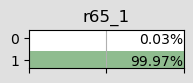
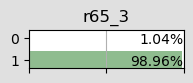
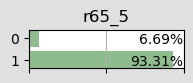
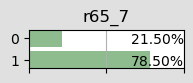

In [101]:
gnb.flow.clear()
for i in [1,3,5,7]:
    gnb.flow.add_html(gnb.getPosterior(ftts_dbn, target = "r65_{}".format(i), evs={'r40_0':0, 'r40_1':0, 'r40_2':0, 'r40_3':0, 'r40_4':0, 'r40_5':0, 'r40_6':0, 'r40_7':0 }), "$P(a{})$".format(i))
gnb.flow.display()

In [61]:
ftts_dbn_rooms =[e.split('_')[0]+('_') for e in ftts_dbn_nodes]

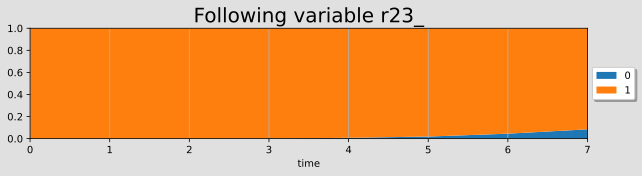

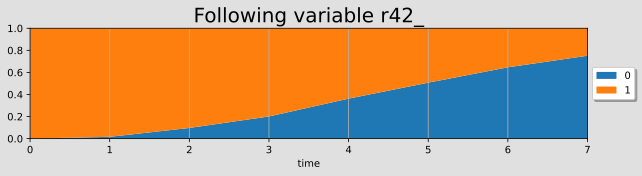

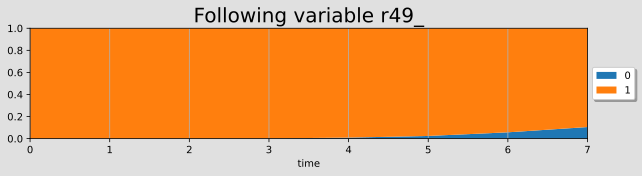

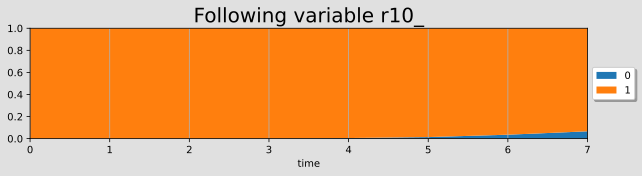

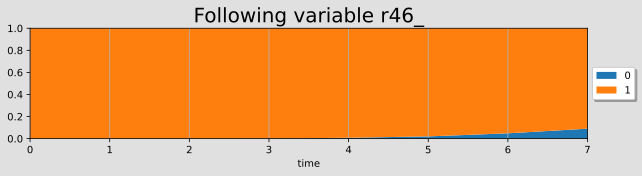

...

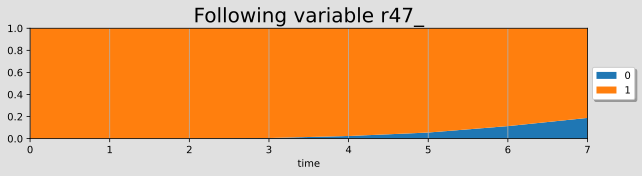

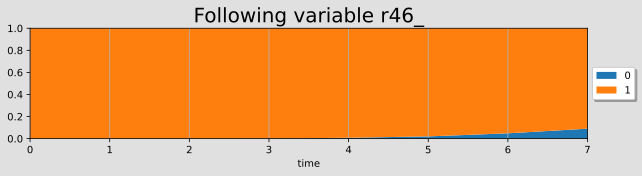

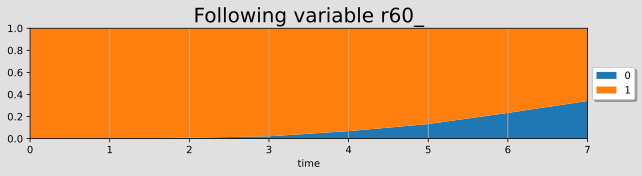

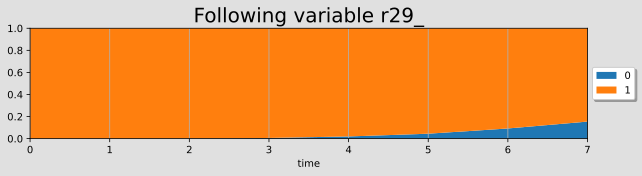

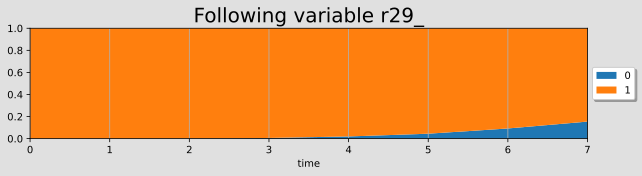

In [ ]:
plt.rcParams['figure.figsize'] = (10, 2)
gdyn.plotFollowUnrolled(ftts_dbn_rooms,ftts_dbn,T=8,evs={'r40_0':0, 'r40_1':0, 'r40_2':0, 'r40_3':0, 'r40_4':0, 'r40_5':0, 'r40_6':0, 'r40_7':0 })

for node in dBN_nodes:
    dag_dBN.cpt(node)
    print(dag_dBN.cpt(node))

dag_dBN.cpt("r1_0").fillWith([0.74, 0.26, 0, 1])


dag_dBN.cpt("r53_0").names # 부모노드를 출력한다. 조건부확률의 조건


dag_dBN.cpt("r38_0").names


gnb.flow.clear()
for i in range(T):
    gnb.flow.add_html(gnb.getPosterior(unroll_dBN, target = "r1_{}".format(i), evs={}), "$P(a{})$".format(i))
gnb.flow.display()

sorted(ftts_dbn.names())